# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


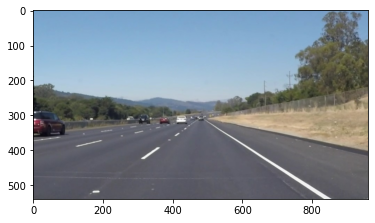

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images
`cv2.cvtColor()` to grayscale or change color
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [3]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            line_image  = cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    
    return line_image
    
    
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    
    draw_lines(line_img, lines)
    return line_img, lines

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)



## Additional helper functions useful for the final challenge
In order to complete the challenge and improve overall performance, after several trials and errors, it is considered that some additional functions should be added using the hints given in **Ideas for Lane Detection Pipeline** section.

Note that instead of grayscale Gaussian blur and Canny edge detection, we considered cv2.inRange function to mask images in different color spaces.   

In [4]:
from matplotlib import gridspec

def convert_color_space(img, convert_to='RGB'):
    """
    `img` is the input image in RGB color space
    
    `convert_to` is the next color space that will be returned on the image
    """
    try:
        if convert_to == 'HSV':
            new = cv2.COLOR_RGB2HSV
        elif convert_to == 'LAB':
            new = cv2.COLOR_RGB2Lab
        elif convert_to == 'HLS':
            new = cv2.COLOR_RGB2HLS

        if convert_to == 'RGB':
            new_image = img
        else:
            new_image = cv2.cvtColor(img, new)
        
        return new_image
    
    except:
        print("This function is only implemented for RGB, HSV, LAB, and HLS color spaces.")
    
def plot_channels(img):
    """
    `img` is the RGB image to be plotted togetter with its channels in each space. 
    
    This function is implented for no specific region. It is called only once to plot an image in different color space with its channels.
    """
    
    conversion_list = ['RGB', 'HSV', 'LAB', 'HLS']
    
    nrow = 4
    ncol = 4
    
    fig = plt.figure(figsize=(5*(ncol+1), 5*(nrow+1)))
    
    gs = gridspec.GridSpec(nrow, ncol,
         wspace=0.20, hspace=0.20, 
         top=1.-0.75/(nrow+1), bottom=0.75/(nrow+1), 
         left=0.5/(ncol+1), right=1-0.5/(ncol+1)) 

    
    for i in range(4):               
        convert_to = conversion_list[i]
        new_img = convert_color_space(img, convert_to)
        ax1 = plt.subplot(gs[i,0])
        ax1.imshow(new_img)
        ax1.set_title(convert_to+" full")
        for ch in range(3):
            ax2 = plt.subplot(gs[i,ch+1])
            # ax2 = fig.add_subplot(4, 4, 4*i+ch+2)
            ax2.imshow(new_img[:,:,ch], cmap='gray')
            ax2.set_title("Channel "+convert_to[ch])
            ax2.set_aspect('equal')
            
    
    # Save image for write-up
    plt.savefig("examples/"+file) # , cv2.cvtColor(new_img,cv2.COLOR_RGB2BGR))
    
    
    plt.show()
    
def mask_line(img, low_threshold, high_threshold):
    """
    `img` is input image 
    `low_threshold` and `high_threshold` are limits for cv2.inRange function to mask the image
    
    The function returns filtered/masked image with respect to the given threshold values
    """
    mask = cv2.inRange(img, np.array(low_threshold,dtype=np.uint8), np.array(high_threshold, dtype=np.uint8))
    return mask

def vertice_constructor(img):
    """
    `img` is input image with size H x W
    
    The function return an array of vertices to be used in region_of_interest() function. 
    """
    H = img.shape[0] # height
    W = img.shape[1] # width
    
    A = (120, H - 1) # bottom left vertex
    B = (W - 30, H - 1) # bottom right vertex
    C = (int(W / 2) + 170,  int(H / 2) + 80) # top right vertex
    D = (int(W / 2) - 70,  int(H / 2) + 80) # top left vertex
    
    return np.array([[A , D, C, B]], dtype=np.int32)
    
    

def draw_solid_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    `img` is input to determine the size of empy image where the soline lines will be drawn.
    `lines` is the hough lines determined from hough_lines() function.
    `color` and `thickness` are line specifications for single solid lane lines.
    
    This function determine which hough line belongs to left or right side by slope analysis and extrapolation.
    Then, it draws a single solid lane line in give color to both side. 
    """
    
    W, H = img.shape[1], img.shape[0] # width and heigth
    
    delta = 0.5 # slope limit to ignore horizontal line segments from hough
    W_half = W / 2 # position limiter for left and right side separation
    

    # pixel lists for right and left side lane lines
    x_r = []
    y_r = []
    x_l = []
    y_l = []

    # generate slope list to take average of line segments on each side
    slope_l = []
    slope_r = []      
        
                    
    # evaluate the slope and decide which side the line segment falls into
    for line in lines:
        for x1, y1, x2, y2 in line:
            if (x2-x1)!=0 and (y2-y1)!=0:
                slope = (y2-y1)/(x2-x1)
            
                if abs(slope)>delta: 
                    
                    if slope>0 and W_half<x1<x2: 
                        x_r.append(x1)
                        x_r.append(x2)
                        y_r.append(y1)
                        y_r.append(y2)
                    elif slope<0 and x1<x2<W_half:
                        x_l.append(x1)
                        x_l.append(x2)
                        y_l.append(y1)
                        y_l.append(y2)

    
    # Interpolate to fit points in each side
    left_fit  = np.polyfit(x_l,y_l,1)
    right_fit = np.polyfit(x_r,y_r,1)
    # Line equation to solve for x-axis of the points for given y-axis components. 
    Y1 = H - 1
    Y2 = int(H / 2) + 80    
    X1_r = int((Y1 - right_fit[1]) / right_fit[0])
    X1_l = int((Y1 - left_fit[1]) / left_fit[0])
    X2_r = int((Y2 - right_fit[1]) / right_fit[0])
    X2_l = int((Y2 - left_fit[1]) / left_fit[0])
    
    
    new_img = np.zeros_like(img)
    # Draw lines 
    new_img = cv2.line(new_img, (X1_r, Y1), (X2_r, Y2), color, thickness) 
    new_img = cv2.line(new_img, (X1_l, Y1), (X2_l, Y2), color, thickness)
    
    return new_img

## Plot an Image from Challenge Video with a Test Image
Here, we plot a frame from the challenge video and a test image in different color spaces with respect to each channel to observe the changes to eloborate possible options for overall pipeline.



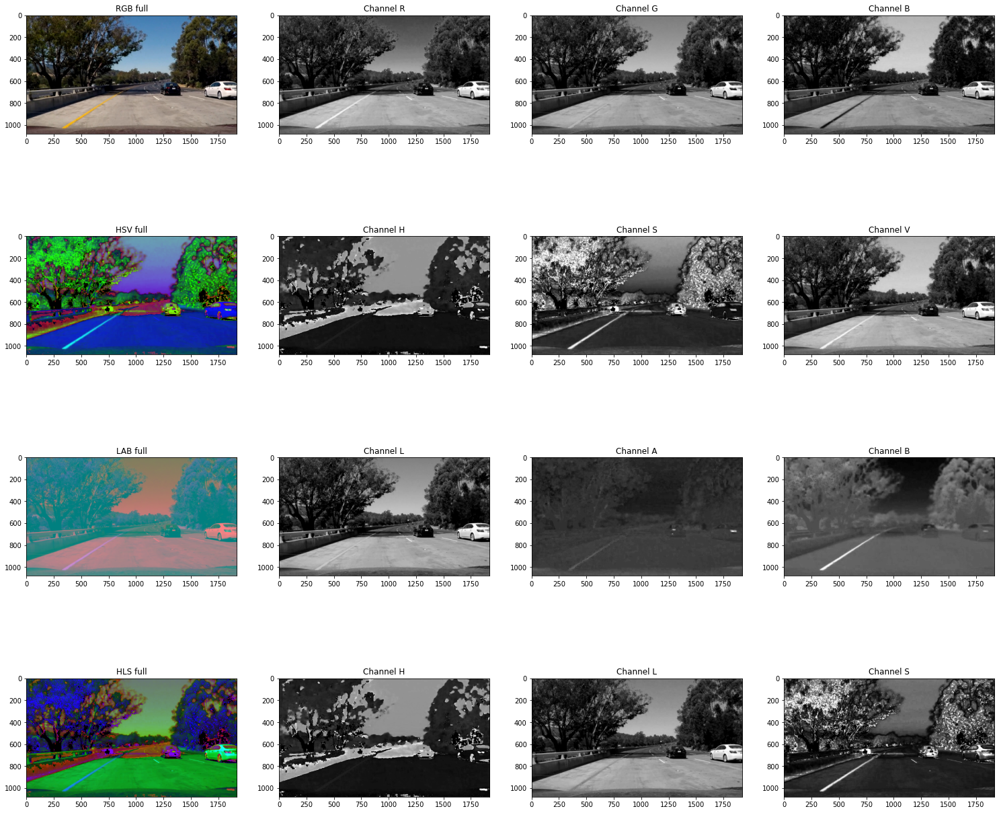

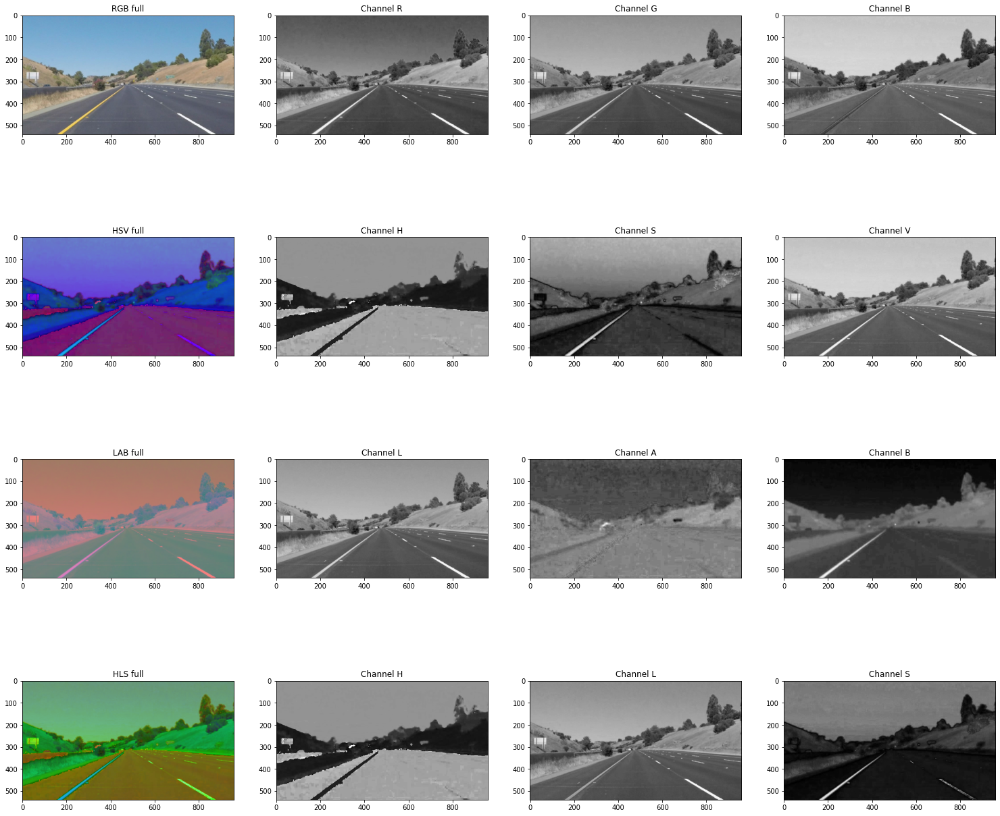

In [5]:
import os
file = os.listdir("test_images/")[2] # the third member is the challenge screnshot
image = mpimg.imread("test_images/"+file)
plot_channels(image)


file = os.listdir("test_images/")[3] # 'solidYellowCurve2.jpg'
image = mpimg.imread("test_images/"+file)
plot_channels(image)




### Observations

We observed that some RGB images are not very good choice to mask some colors and thus edge detection performance drops. Instead, we investigated different color spaces to consider yellow and white lanes separately. 

**We noticed that B-channel on LAB space masks yellow very well and white lanes on HLS space look shiny bright green.**

That's why we decided to use those color spaces for the rest of the lane detection pipeline. 

## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

In [6]:
import os
os.listdir("test_images/")

['solidYellowCurve.jpg',
 'whiteCarLaneSwitch.jpg',
 'challenge.jpg',
 'solidYellowCurve2.jpg',
 'solidWhiteCurve.jpg',
 'solidYellowLeft.jpg',
 'solidWhiteRight.jpg']

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

**The pipeline involves the following steps.**
1. We will create a dictionary in which different data types will be stored along the pipeline construction. 
2. It will include
    * the original image in RGB, 
    * image in LAB with B channel, 
    * yellow mask lines,
    * Hough yellow lines,
    * image in HLS,
    * white mask lines,
    * Hough white lines, and
    * Overlayed images, etc.
3. Then, we will update and generalize the pipeline for combination of detecting both yellow and white lines simutenously. 
4. Finally, we will draw single solid lines on both sides of the car view. 


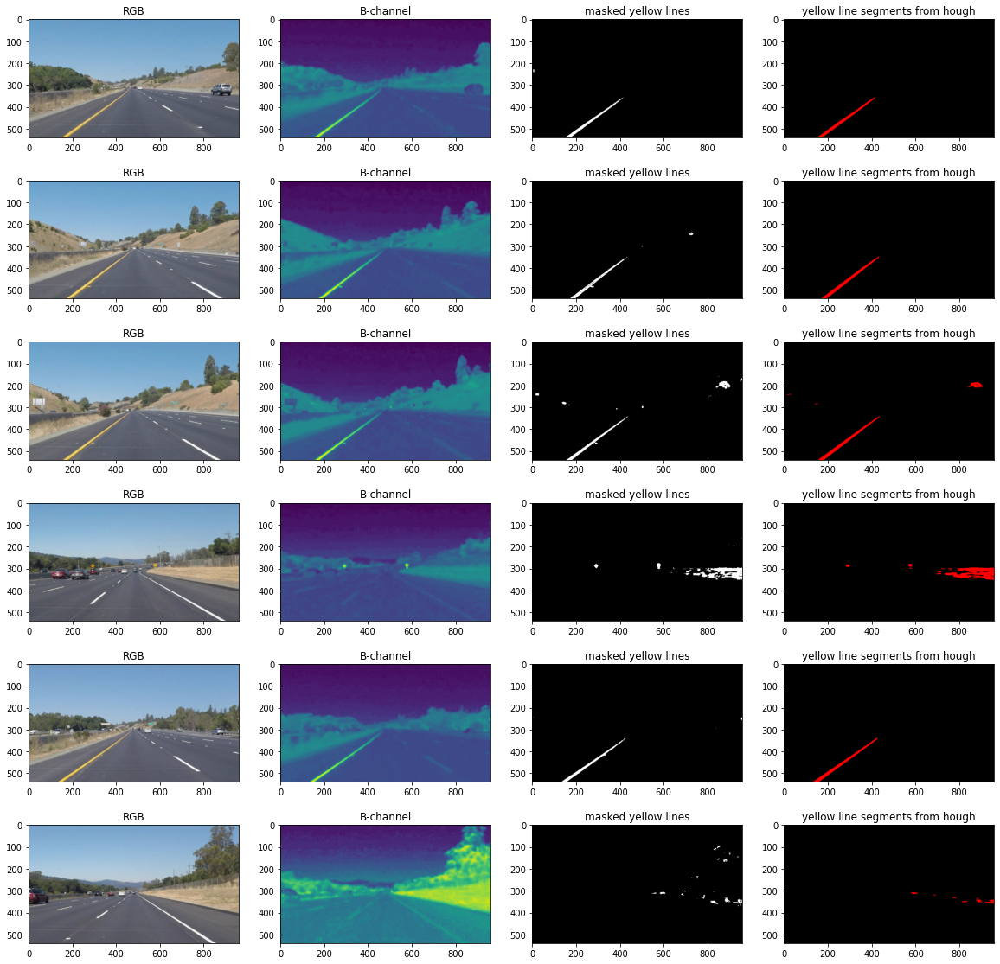

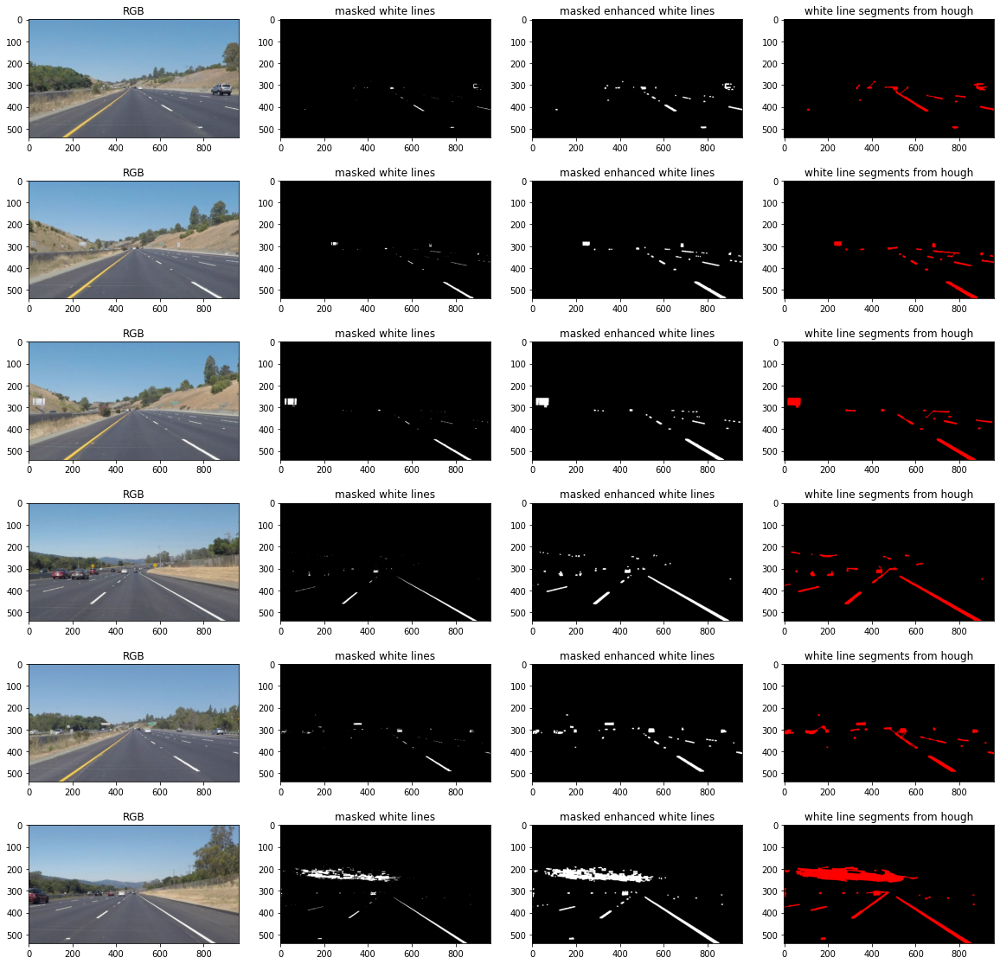

In [17]:
# Get the test images from the driectory
## note that we exclude challange video screenshot here
files  = os.listdir("test_images/")[:2]
files2 = os.listdir("test_images/")[3:]
for f in files2:
    files.append(f)

# Create a dictionary to store all different data types associated with each image
data = {}
kernel = np.ones((5,5), np.uint8) # kernel for morpholigical transformation to enhance white lines

for i in range(len(files)):
    image = mpimg.imread('test_images/'+files[i])
    if image.shape[2]>3:
        image = image[:,:,:3]
    image_LAB = convert_color_space(image, 'LAB')
    image_B = image_LAB[:,:,2]
    image_HLS = convert_color_space(image, 'HLS')
    
       
    # Line detection with cv2.inRange()
    mask_yellow = mask_line(image_LAB, [100,100,150], [220,180,255]) # gives yellow lines in an image in LAB space
    
    
    mask_white = mask_line(image_HLS, [0,200,0], [180,255,255]) # gives white lines in an image in HLS space
    # Enhance white lines for better performance. 
    mask_white_enh = cv2.dilate(mask_white, kernel, iterations =2) 
    mask_white_enh = cv2.erode(mask_white, kernel, iterations =2)
    mask_white_enh = cv2.dilate(mask_white, kernel, iterations =1)
    
    # Hough images and lines for each color separately
    hough_yellow, hough_yl = hough_lines(mask_yellow, rho=1, theta=np.pi/180, threshold=50, min_line_len=10, max_line_gap=10)
    hough_white, hough_wl = hough_lines(mask_white_enh, rho=1, theta=np.pi/180, threshold=5, min_line_len=3, max_line_gap=30)
       
    # Add data to the dictionary
    data[i] = {'image': image, 'LAB': image_LAB, 'channelB': image_B, 'mask_yellow': mask_yellow, \
               'hough_yellow': hough_yellow, 'hough_yl': hough_yl, 'mask_white':mask_white, \
               'mask_white_enhanced': mask_white_enh, 'hough_white': hough_white, 'hough_wl': hough_wl}
    
    
# Plot for yellow line detection


fig = plt.figure(figsize=(20,20))
for i in range(len(data)):
    ax1 = fig.add_subplot(6, 4, 4*i+1)
    plt.imshow(data[i]['image'])
    ax1.set_title('RGB')
    ax2 = fig.add_subplot(6, 4, 4*i+2)
    plt.imshow(data[i]['channelB'])
    ax2.set_title('B-channel')
    ax3 = fig.add_subplot(6, 4, 4*i+3)
    plt.imshow(data[i]['mask_yellow'], cmap ='gray')
    ax3.set_title('masked yellow lines')
    ax4 = fig.add_subplot(6, 4, 4*i+4)
    plt.imshow(data[i]['hough_yellow'], cmap='gray')
    ax4.set_title('yellow line segments from hough')

plt.savefig("examples/"+"yellow_line.png")
plt.show()

# Plot for white line detection
fig = plt.figure(figsize=(20,20))
for i in range(len(data)):
    ax1 = fig.add_subplot(6, 4, 4*i+1)
    plt.imshow(data[i]['image'])
    ax1.set_title('RGB')
    ax2 = fig.add_subplot(6, 4, 4*i+2)
    plt.imshow(data[i]['mask_white'], cmap='gray')
    ax2.set_title('masked white lines')
    ax3 = fig.add_subplot(6, 4, 4*i+3)
    plt.imshow(data[i]['mask_white_enhanced'], cmap ='gray')
    ax3.set_title('masked enhanced white lines')
    ax4 = fig.add_subplot(6, 4, 4*i+4)
    plt.imshow(data[i]['hough_white'], cmap='gray')
    ax4.set_title('white line segments from hough')
    
plt.savefig("examples/"+"white_line.png")
plt.show()

**So far, we could succesfully detect yellow and white lines separetely as shown above.**

Now, it is time to generalize our line detection for both cases. To do that, we will use the benefit of the *data* dictionary that we created previously. After simply adding yelow and white line detections, we will focus on some specific region of interest and mask other portion in images. 


In other words, we will only consider a trapezoidal region of interest and extract the lanes on the left and right side together. 


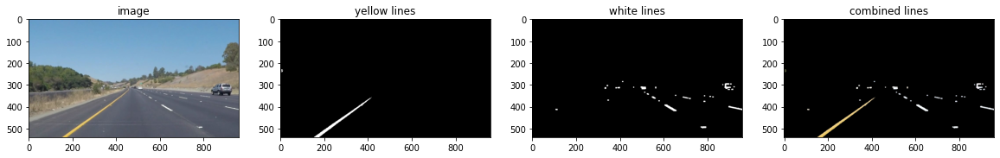

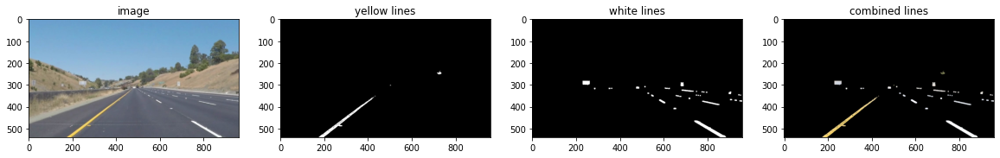

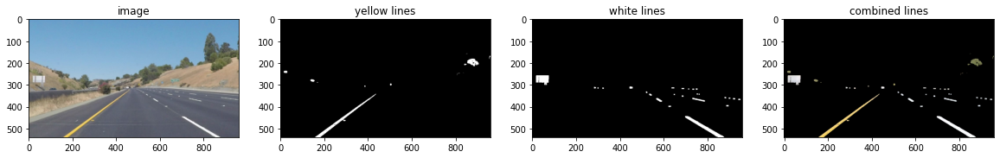

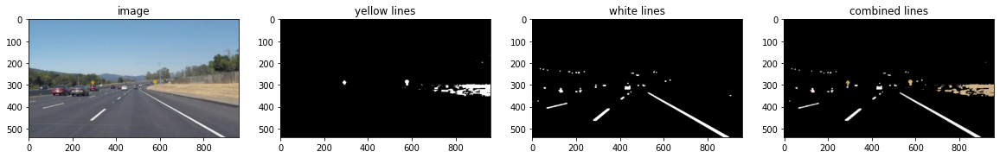

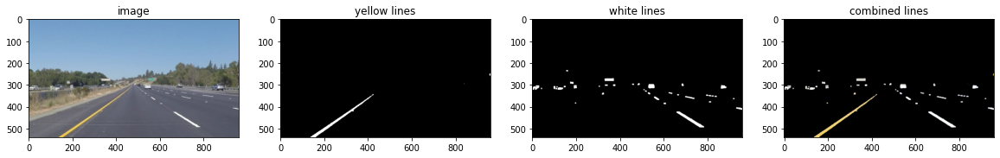

...

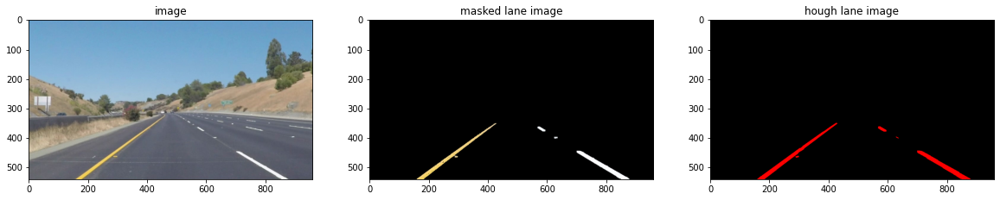

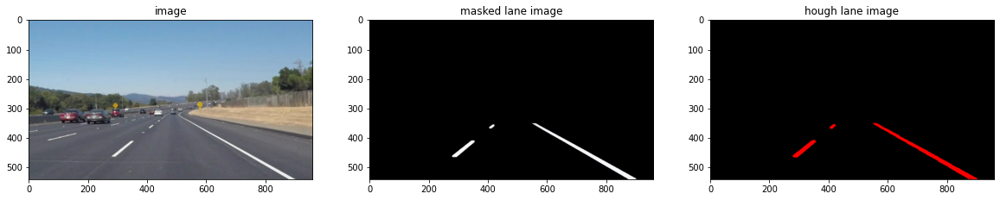

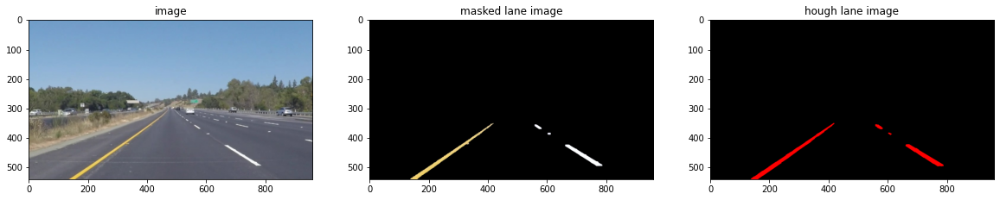

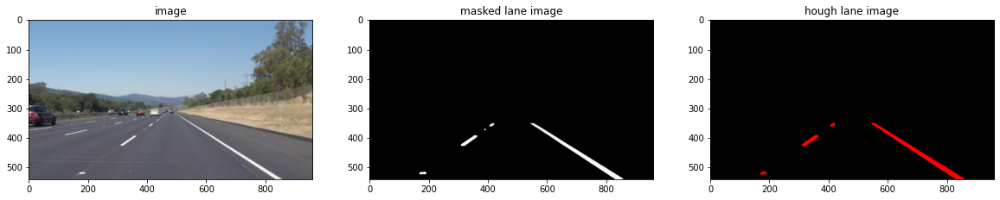

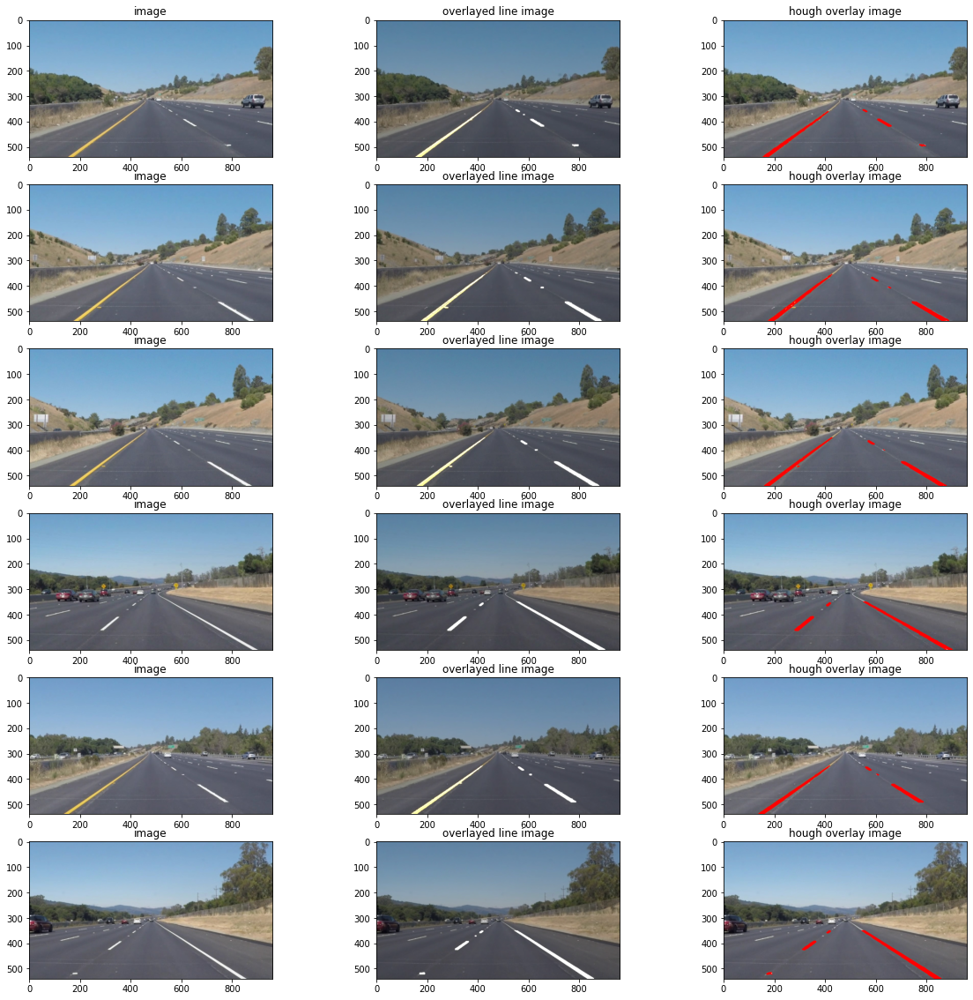

In [19]:
for i in range(len(data)):
    image = data[i]['image']
    mask_yellow = data[i]['mask_yellow']
    mask_white = data[i]['mask_white_enhanced']
    mask_combined = mask_yellow + mask_white
    
    masked_image = np.copy(image)
    masked_image = cv2.dilate(masked_image, kernel=np.ones((5,5), np.uint8), iterations=2)
    masked_image = cv2.erode(masked_image, kernel=np.ones((5,5), np.uint8), iterations=2)
    masked_image = cv2.dilate(masked_image, kernel=np.ones((5,5), np.uint8), iterations=1)
    masked_image[mask_combined!=255] = [0,0,0]
    
    # Mask the image only in a trapezodial region of interest 
    masked_lane_image = region_of_interest(masked_image, vertice_constructor(masked_image))
    hough_lane_image, hough_line = hough_lines(grayscale(masked_lane_image), rho=1, theta=np.pi/180, threshold=17, min_line_len=7, max_line_gap=0)
    
    # Overlay image with lane lines and hough lines
    overlayed_line_image = weighted_img(masked_lane_image, image, α=0.8, β=1., γ=0.)
    
    hough_overlay = np.copy(image)
    hough_overlay = draw_lines(hough_overlay, hough_line, color=[255, 0, 0], thickness=2)  
    
    # Add new data to the dictionary
    data[i]['masked_image'] = masked_image
    data[i]['masked_lane_image'] = masked_lane_image
    data[i]['hough_lane_image'] = hough_lane_image
    data[i]['hough_line'] = hough_line
    data[i]['overlayed_line_image'] = overlayed_line_image
    data[i]['hough_overlay'] = hough_overlay

# Plot for combined yellow and white lines detection in an image
for i in range(len(data)):
    plt.figure(figsize=(20,20))
    ax = plt.subplot(1,4,1)
    ax.set_title('image')
    plt.imshow(data[i]['image'])
    ax = plt.subplot(1,4,2)
    ax.set_title('yellow lines')
    plt.imshow(data[i]['mask_yellow'], cmap='gray')
    ax = plt.subplot(1,4,3)
    ax.set_title('white lines')
    plt.imshow(data[i]['mask_white_enhanced'], cmap='gray')
    ax = plt.subplot(1,4,4)
    ax.set_title('combined lines')
    plt.imshow(data[i]['masked_image'])

# Plot for extracted Hough lines in the region of interest
for i in range(len(data)):
    plt.figure(figsize=(20,20))
    ax = plt.subplot(1,3,1)
    ax.set_title('image')
    plt.imshow(data[i]['image'])
    ax = plt.subplot(1,3,2)
    ax.set_title('masked lane image')
    plt.imshow(data[i]['masked_lane_image'], cmap='gray')
    ax = plt.subplot(1,3,3)
    ax.set_title('hough lane image')
    plt.imshow(data[i]['hough_lane_image'])

# Plot for overlayed Hough lines in the region of interest

fig = plt.figure(figsize=(20,20))
for i in range(len(data)):
    ax1 = fig.add_subplot(6,3,3*i+1)
    ax1.set_title('image')
    plt.imshow(data[i]['image'])
    ax2 = fig.add_subplot(6,3,3*i+2)
    ax2.set_title('overlayed line image')
    plt.imshow(data[i]['overlayed_line_image'])
    ax3 = fig.add_subplot(6,3,3*i+3)
    ax3.set_title('hough overlay image')
    plt.imshow(data[i]['hough_overlay'])
    
plt.savefig("examples/"+"hough_lines.png")
plt.show()  
    
    
    

**As seen in the figures, the pipeline can overlay the hough lines successfully with the given test images. The final task in hand is to draw a single solid line for each side instead of separate line segments.**

In order to accomplish that, we decided to create a new function *draw_solid_lines()* (See the additional functions section above for details. This function separates the image into two vertically and also only considers line segments that have slope largen than a threshold in order to neglect horizontal line segments in the images. 

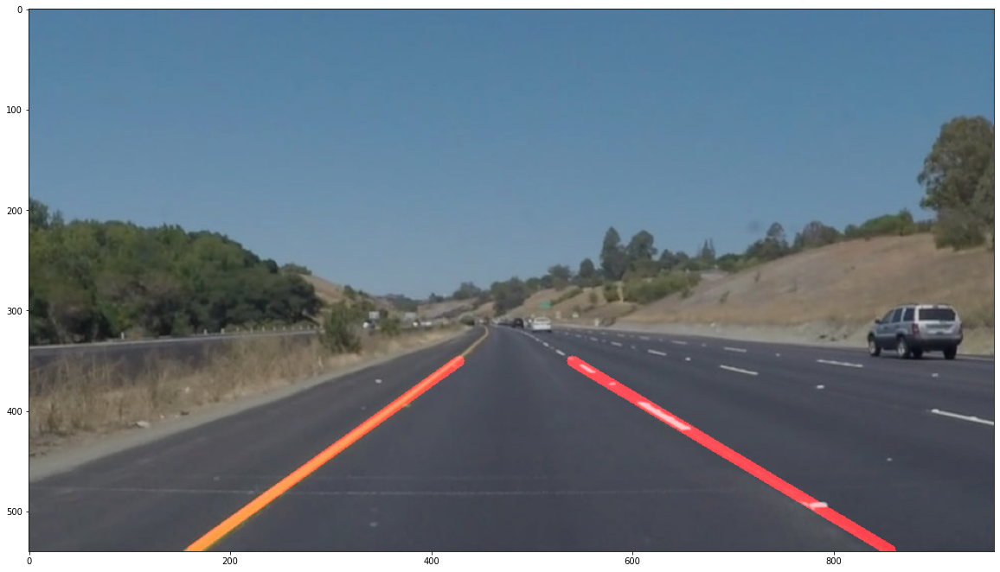

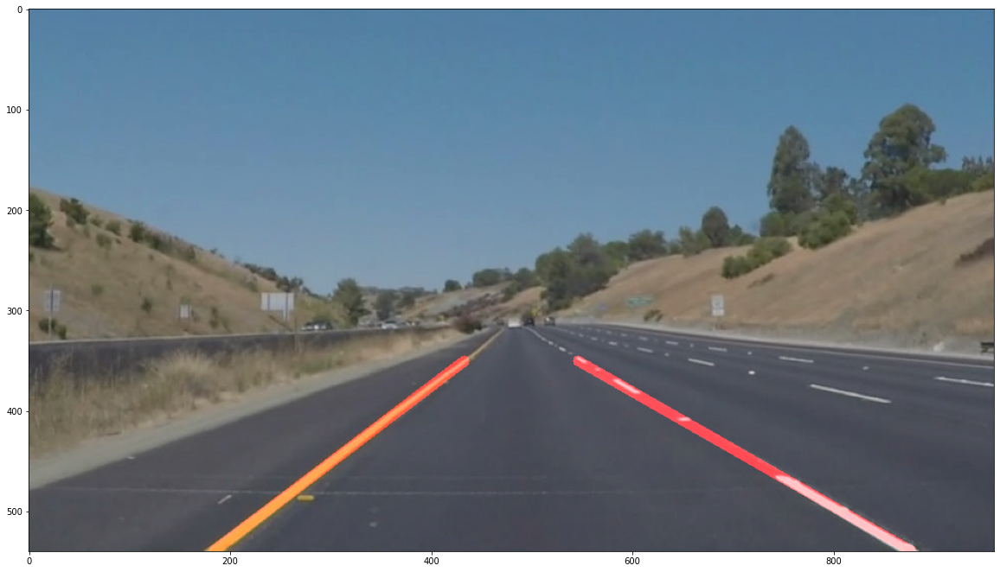

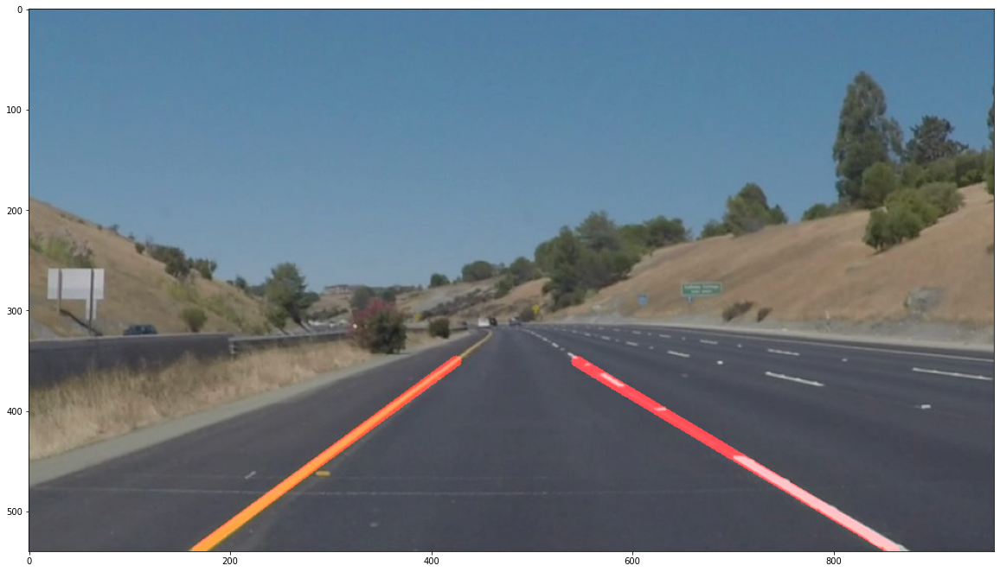

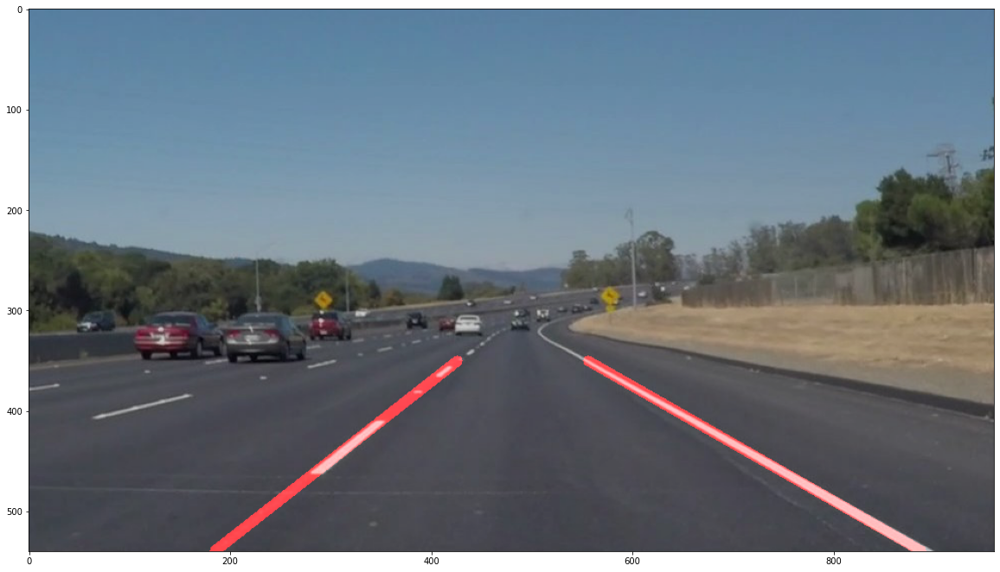

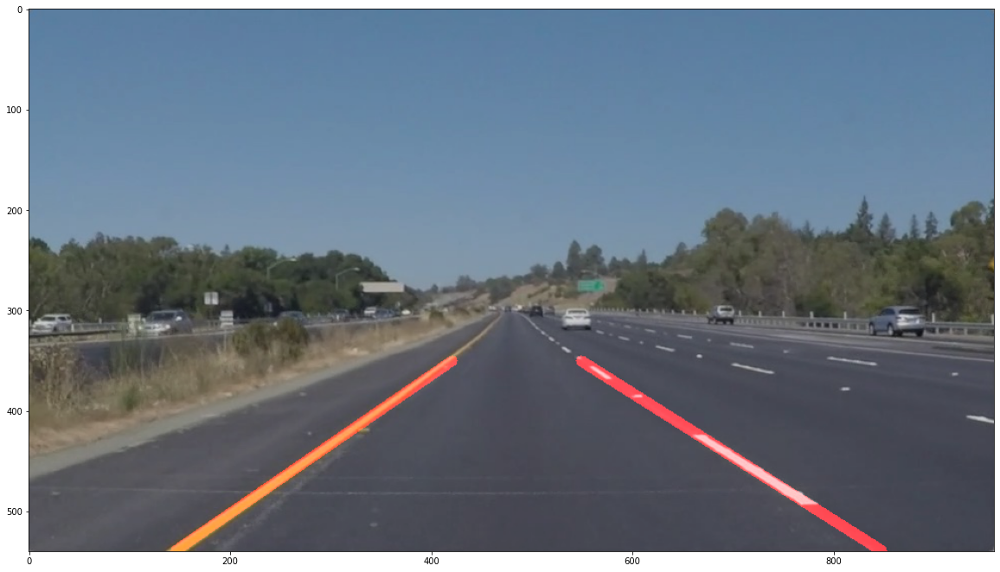

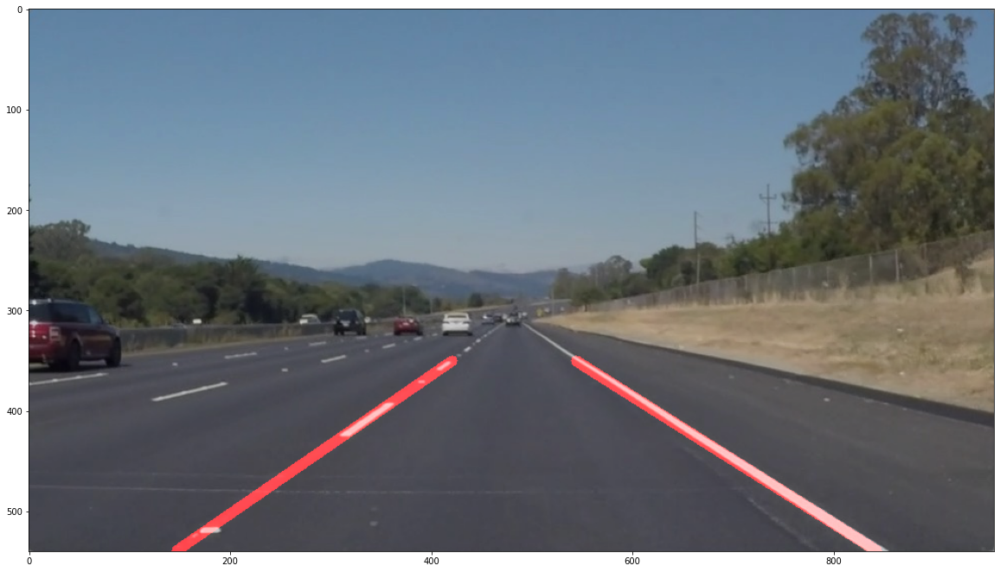

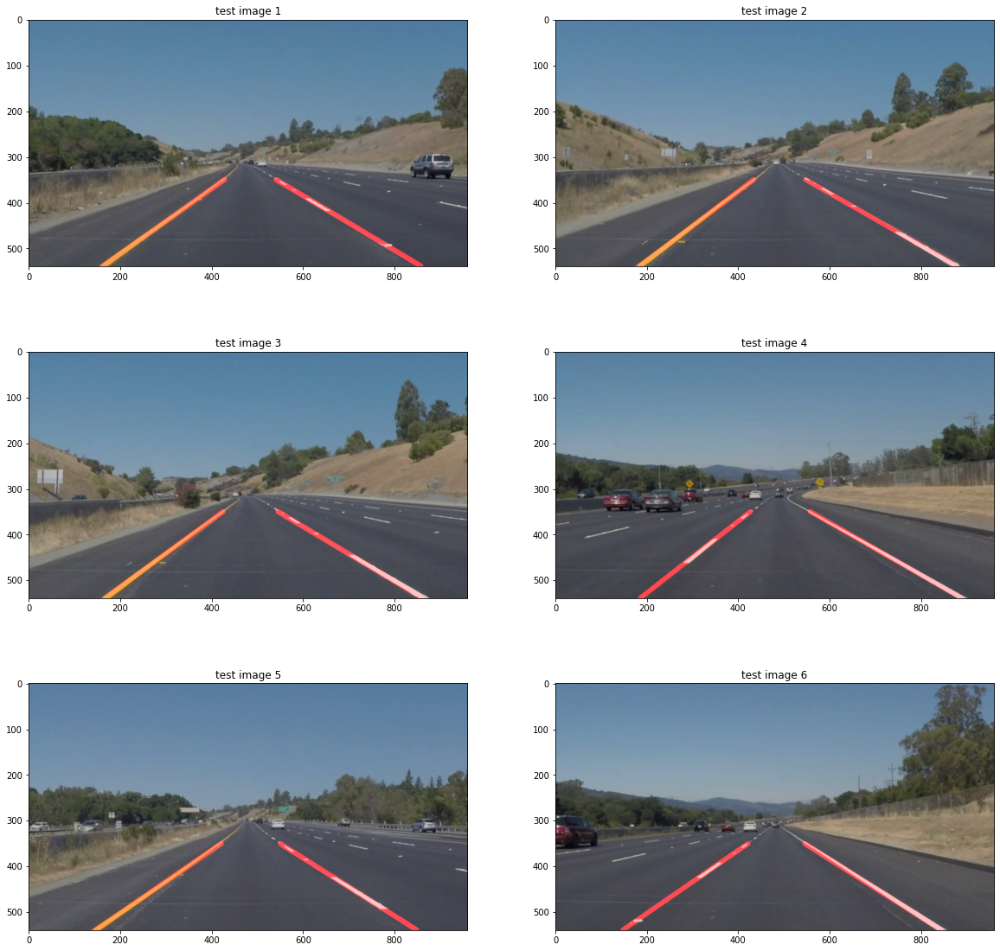

In [24]:
for i in range(len(data)):
    image = data[i]['image']
    solid_lane_image = np.copy(image)
    
    hough_line = data[i]['hough_line']
    
    color = [255, 0, 0]
    # Draw single solid lines on each side
    solid_lane_image = draw_solid_lines(solid_lane_image, hough_line, color=color, thickness=10)
    # Overlay with the original image
    final_image = weighted_img(solid_lane_image, image, α=0.8, β=1., γ=0.)
    
    # Plot the final result
    plt.figure(figsize=(20,20))
    plt.imshow(final_image)
    plt.show()
    # Save images into the specified directory
    cv2.imwrite("test_images_output/"+files[i], cv2.cvtColor(final_image,cv2.COLOR_RGB2BGR))

# Save a plot for write-up
fig = plt.figure(figsize=(20,20))
for i in range(len(data)):
    image = data[i]['image']
    solid_lane_image = np.copy(image)
    
    hough_line = data[i]['hough_line']
    
    color = [255, 0, 0]
    # Draw single solid lines on each side
    solid_lane_image = draw_solid_lines(solid_lane_image, hough_line, color=color, thickness=10)
    # Overlay with the original image
    final_image = weighted_img(solid_lane_image, image, α=0.8, β=1., γ=0.)
    ax1 = fig.add_subplot(3,2,i+1)
    plt.imshow(final_image)
    ax1.set_title('test image '+str(i+1))

    plt.savefig("examples/"+"final.png")
plt.show()     
    

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [10]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [11]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    
    # Yellow line detection
    image_LAB = convert_color_space(image, 'LAB')
    mask_yellow = mask_line(image_LAB, [100,100,150], [220,180,255])
    
    # White line detection and enhancement
    image_HLS = convert_color_space(image, 'HLS')
    mask_white = mask_line(image_HLS, [0,200,0], [180,255,255])
    
    mask_white = cv2.dilate(mask_white, kernel=np.ones((5,5), np.uint8), iterations=2)
    mask_white = cv2.erode(mask_white, kernel=np.ones((5,5), np.uint8), iterations=2)
    mask_white = cv2.dilate(mask_white, kernel=np.ones((5,5), np.uint8), iterations=1)
    
    # Combine the line detections
    line_image = mask_yellow + mask_white
    
    # Mask overall image with dilation and erosion to enhance detection
    mask_image = np.copy(image)
    mask_image = cv2.dilate(mask_image, kernel=np.ones((5,5), np.uint8), iterations=2)
    mask_image = cv2.erode(mask_image, kernel=np.ones((5,5), np.uint8), iterations=2)
    mask_image = cv2.dilate(mask_image, kernel=np.ones((5,5), np.uint8), iterations=1)
    
    # Apply line detection mask
    mask_image[line_image!=255] = [0, 0, 0]
    
    # Region of Interest
    mask_lane_image = region_of_interest(mask_image, vertice_constructor(mask_image))
    
    # Create Hough line segments
    hough_image, hough_line = hough_lines(grayscale(mask_lane_image), rho=1, theta=np.pi/180, threshold=17, min_line_len=7, max_line_gap=0)
    
    # Draw single solid lane lines
    solid_lane_image = np.zeros_like(image)
    solid_lane_image = draw_solid_lines(solid_lane_image, hough_line, color=color, thickness=10)
    
    # Overlay with original image
    final_image = weighted_img(solid_lane_image, image, α=0.8, β=1., γ=0.)
    
    return final_image

Let's try the one with the solid white lane on the right first ...

In [12]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

t:   3%|▎         | 7/221 [00:00<00:03, 60.18it/s, now=None]

Moviepy - Building video test_videos_output/solidWhiteRight.mp4.
Moviepy - Writing video test_videos_output/solidWhiteRight.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/solidWhiteRight.mp4
CPU times: user 10.5 s, sys: 2.07 s, total: 12.6 s
Wall time: 4.4 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [13]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [14]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
## clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

t:   1%|          | 6/681 [00:00<00:11, 59.60it/s, now=None]

Moviepy - Building video test_videos_output/solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output/solidYellowLeft.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/solidYellowLeft.mp4
CPU times: user 32.5 s, sys: 6.2 s, total: 38.7 s
Wall time: 13.4 s


In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [16]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

t:   2%|▏         | 5/251 [00:00<00:06, 40.90it/s, now=None]

Moviepy - Building video test_videos_output/challenge.mp4.
Moviepy - Writing video test_videos_output/challenge.mp4



Moviepy - Done !
Moviepy - video ready test_videos_output/challenge.mp4
CPU times: user 16.4 s, sys: 3 s, total: 19.5 s
Wall time: 8.37 s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))